In [1]:
import pandas as pd
import cv2
import sys
import os

sys.path.append("../../")
from src import utils
from src.dataset2D import MRIDataset2D
from src.models2D import Model2DTimm
import albumentations as A
from albumentations.pytorch import ToTensorV2

utils.set_seed(42)

results_dir = '../../results/preprocessed_data/'
labels=["Noise", "Zipper", "Positioning", "Banding", "Motion", "Contrast", "Distortion"]


df_train = pd.read_csv(os.path.join(results_dir, 'df_train_imgs.csv'))
df_test = pd.read_csv(os.path.join(results_dir, 'df_test_imgs.csv'))
df_train.head(2)


,filename,Noise,Zipper,Positioning,Banding,Motion,Contrast,Distortion,path,patient_id,dim_x,dim_y,dim_z,spacing_x,spacing_y,spacing_z,view,img_path,npy_path,ratio
0,LISA_0001_LF_axi.nii.gz,0,0,0,0,0,0,0,/data/cristian/projects/med_data/rise-miccai/t...,LISA_0001,36,120,146,5.0,1.5,1.5,axi,/data/cristian/projects/med_data/rise-miccai/t...,/data/cristian/projects/med_data/rise-miccai/t...,0.014792
1,LISA_0001_LF_axi.nii.gz,0,0,0,0,0,0,0,/data/cristian/projects/med_data/rise-miccai/t...,LISA_0001,36,120,146,5.0,1.5,1.5,axi,/data/cristian/projects/med_data/rise-miccai/t...,/data/cristian/projects/med_data/rise-miccai/t...,0.014792


In [2]:

class args_class:
    def __init__(self):
        self.device = "cuda:3"
        self.label_cols = "Noise,Zipper,Positioning,Banding,Motion,Contrast,Distortion".split(",")
        self.seed = 42
        self.n_splits = 3
args = args_class()

In [3]:
# 📄 Leer CSVs
df_train_original = pd.read_csv(os.path.join(results_dir, 'df_train.csv'))

df_train["patient_id"] = df_train["filename"].str.extract(r"(LISA_\d+)")

df_train,df_test_back = utils.robust_split_by_patient(df_train_original,df_train,args)
df_test_back.shape

🎯 Labels usados para estratificación: ['Positioning', 'Banding']
Train    : Noise true dist: [384  49  45]
Train    : Zipper true dist: [362  93  23]
Train    : Positioning true dist: [423  43  12]
Train    : Banding true dist: [452  14  12]
Train    : Motion true dist: [345  75  58]
Train    : Contrast true dist: [333 123  22]
Train    : Distortion true dist: [391  51  36]
Testback : Noise true dist: [40 10  1]
Testback : Zipper true dist: [34 12  5]
Testback : Positioning true dist: [44  4  3]
Testback : Banding true dist: [49  1  1]
Testback : Motion true dist: [39  2 10]
Testback : Contrast true dist: [40 11  0]
Testback : Distortion true dist: [43  4  4]
df_train antes del merge :  (19120, 20)
df_train_original antes del merge :  (478, 18)
df_train_unique   antes del merge :  (216, 18)
df_train despues del merge :  (19120, 21)
['filename', 'Noise', 'Zipper', 'Positioning', 'Banding', 'Motion', 'Contrast', 'Distortion', 'path', 'patient_id', 'dim_x', 'dim_y', 'dim_z', 'spacing_x', 

/home/va0831/env_cris/lib64/python3.9/site-packages/sklearn/model_selection/_split.py:950: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


(2040, 20)

In [4]:
df_train_original["patient_id"]

0      LISA_0001
1      LISA_0001
2      LISA_0001
3      LISA_0002
4      LISA_0002
         ...    
524    LISA_2096
525    LISA_2097
526    LISA_2098
527    LISA_2099
528    LISA_2100
Name: patient_id, Length: 529, dtype: object

In [5]:
# ✅ Crea el dataset (usa `use_augmentation=False` para visualización clara)
dataset_vis = MRIDataset2D(df=df_test_back,is_train=True,use_augmentation=False,is_numpy=True,labels=labels)

100%|██████████| 2040/2040 [00:00<00:00, 4116.52it/s]


In [6]:
import torch
model = Model2DTimm("maxvit_nano_rw_256.sw_in1k",1,7,3,0.3,True)
#save_dir = "/data/cristian/projects/med_data/rise-miccai/task-1/2d_models/results/maxvit_nano_rw_256.sw_in1k2D_final"
#save_dir = "/data/cristian/projects/med_data/rise-miccai/task-1/2d_models/results/maxvit_nano_rw_256.sw_in1k2D_finalratio0.1"
save_dir = "/data/cristian/projects/med_data/rise-miccai/task-1/2d_models/results/maxvit_nano_rw_256_flv3_8_0.1"

fold = 0
model.load_state_dict(torch.load(f"{save_dir}/model_fold{fold}.pt"))
model.to(args.device)

Model2DTimm(
  (backbone): MaxxVit(
    (stem): Stem(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (norm1): BatchNormAct2d(
        32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
        (drop): Identity()
        (act): SiLU(inplace=True)
      )
      (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (stages): Sequential(
      (0): MaxxVitStage(
        (blocks): Sequential(
          (0): MaxxVitBlock(
            (conv): MbConvBlock(
              (shortcut): Downsample2d(
                (pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
                (expand): Identity()
              )
              (pre_norm): BatchNormAct2d(
                64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
                (drop): Identity()
                (act): Identity()
              )
              (down): Identity()
              (conv1_1x1): Conv

In [7]:
label_cols = ["Noise", "Zipper", "Positioning", "Banding", "Motion", "Contrast", "Distortion"]
label_name = "Zipper"
label_idx = label_cols.index(label_name)

cnt = 0
idx = 0
list_idx = []
# 🔍 Recorremos el dataset hasta encontrar un ejemplo con Zipper == 2
while idx<len(dataset_vis):
    _, y, _, _ = dataset_vis[idx]  # y es tensor de shape (7,)
    if y[label_idx].item() == 2:
        cnt+=1
        list_idx.append(idx+15)
        idx+=40
        print(f"✅ Encontrado: idx={idx}, {label_name}=2")
        
    if cnt>10:
       break
    idx +=1

✅ Encontrado: idx=1120, Zipper=2
✅ Encontrado: idx=1200, Zipper=2
✅ Encontrado: idx=1720, Zipper=2
✅ Encontrado: idx=1880, Zipper=2
✅ Encontrado: idx=1921, Zipper=2


In [8]:
import math
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

def plot_group_indices(model, dataset, args, indices, label_name, ncols=6, figsize_per_col=3.0):
    """
    Plotea un grupo de índices (mismo volumen) en una grilla.
    Para cada imagen muestra y_true, y_pred y p0/p1/p2 en el título.

    Params:
        model: modelo ya en eval() y en el device correspondiente
        dataset: tu MRIDataset2D (o similar)
        args: debe tener .device y .label_cols
        indices: lista de índices (int) del dataset para este volumen
        label_name: str, por ejemplo "Banding"
        ncols: columnas del grid
        figsize_per_col: ancho por columna (para escalar el tamaño)
    """
    model.eval()
    label_idx = args.label_cols.index(label_name)

    # Ordena índices por si vienen desordenados (útil para ver la progresión de slices)
    indices = sorted(indices)

    n = len(indices)
    ncols = max(1, ncols)
    nrows = math.ceil(n / ncols)
    plt.figure(figsize=(figsize_per_col * ncols, figsize_per_col * nrows))

    # Nombre del volumen para el título global (intenta leer del df si existe)
    try:
        base_name = dataset.df.iloc[indices[0]]["filename"]
    except Exception:
        # fallback: parsea del path
        try:
            base_name = dataset.df.iloc[indices[0]]["img_path"].split("/")[-1].rsplit("_", 1)[0]
        except Exception:
            base_name = f"group_of_{n}_slices"

    for j, idx in enumerate(indices):
        ax = plt.subplot(nrows, ncols, j+1)

        # Carga del dataset
        x, y, path, view = dataset[idx]        # x: (C,H,W), y: (7,), view: one-hot (3,)
        x_vis = x.clone()                       # para mostrar como imagen
        if x_vis.dim() == 3 and x_vis.shape[0] == 1:
            x_vis = x_vis.repeat(3, 1, 1)      # a RGB para visualizar bonito
        img_np = x_vis.permute(1, 2, 0).cpu().numpy()
        img_np = np.clip(img_np, 0, 1)

        # Forward (intenta con view si tu modelo lo requiere)
        with torch.no_grad():
            xx = x.unsqueeze(0).to(args.device)
            # algunos modelos esperan (x, view); otros solo (x)
            try:
                vv = view.unsqueeze(0).to(args.device)
                logits = model(xx)  # (1, 7, 3)
            except TypeError:
                logits = model(xx)      # (1, 7, 3)

            probs = F.softmax(logits[0, label_idx], dim=-1).detach().cpu().numpy()  # (3,)
            y_pred = int(np.argmax(probs))

        y_true = int(y[label_idx].item()) if torch.is_tensor(y) else int(y[label_idx])

        # Mostrar imagen
        ax.imshow(img_np, cmap=None)
        ax.axis("off")

        # Título con colores según acierto
        color = "tab:green" if y_pred == y_true else "tab:red"
        title = (f"{label_name} | y={y_true} pred={y_pred}\n"
                 f"p0={probs[0]:.2f} p1={probs[1]:.2f} p2={probs[2]:.2f}")
        ax.set_title(title, fontsize=9, color=color)

    plt.suptitle(f"{base_name} — {label_name} ({n} slices)", fontsize=12)
    plt.tight_layout()
    plt.show()


In [9]:
import math, numpy as np, torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

def _pick_default_target_layer(model):
    """
    Intenta encontrar una capa 'conv' razonable para Grad-CAM.
    Ajusta esto si usas otro backbone.
    """
    # Timm MaxViT típico:
    try:
        return model.backbone.stages[3].blocks[-1].conv.norm2
    except Exception:
        pass
    # Última capa con atributo 'conv' que tenga grad
    for name in reversed(list(dict(model.named_modules()).keys())):
        m = dict(model.named_modules())[name]
        if hasattr(m, 'weight') or 'conv' in name.lower():
            return m
    # fallback
    return list(model.modules())[-1]

def _gradcam_on_image(img_np, cam, alpha=0.5):
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    heatmap = plt.cm.jet(cam)[..., :3]  # (H,W,3)
    overlay = np.clip(img_np + alpha * heatmap, 0, 1)
    return overlay

def plot_group_indices_with_cam(
    model, dataset, args, indices, label_name,
    ncols=6, figsize_per_col=3.2,
    class_choice="pred",   # "pred" | 0 | 1 | 2
    target_layer=None,
    cam_alpha=0.5
):
    """
    Muestra una grilla de slices con Grad-CAM superpuesto y título con y/pred/probs.
    - class_choice="pred": usa la clase predicha para CAM; o un int 0/1/2 para forzarla.
    - target_layer: pasa tu capa conv/feature (p.ej. model.backbone.stages[3]....norm2).
    """
    model.eval()
    device = args.device
    label_idx = args.label_cols.index(label_name)

    indices = sorted(indices)
    n = len(indices)
    ncols = max(1, ncols)
    nrows = math.ceil(n / ncols)
    plt.figure(figsize=(figsize_per_col * ncols, figsize_per_col * nrows))

    # Elige capa objetivo (si no te pasan una)
    if target_layer is None:
        target_layer = _pick_default_target_layer(model)

    # título global
    try:
        vol_name = dataset.df.iloc[indices[0]]["filename"]
    except Exception:
        vol_name = f"group_of_{n}_slices"

    for j, idx in enumerate(indices):
        ax = plt.subplot(nrows, ncols, j+1)

        # --- Datos ---
        x, y, path, view = dataset[idx]  # x: (C,H,W), y: (7,)
        # Imagen para visualizar (3 canales)
        x_vis = x if x.shape[0] != 1 else x.repeat(3, 1, 1)
        img_np = x_vis.permute(1, 2, 0).cpu().numpy()
        img_np = np.clip(img_np, 0, 1)

        # --- Hooks ---
        fmap = {"val": None}
        grads = {"val": None}

        def fwd_hook(m, inp, out):
            fmap["val"] = out.detach()

        def bwd_hook(m, gin, gout):
            grads["val"] = gout[0].detach()

        h1 = target_layer.register_forward_hook(fwd_hook)
        h2 = target_layer.register_full_backward_hook(bwd_hook)

        # --- Forward & backward ---
        xx = x.unsqueeze(0).to(device)
        try:
            vv = view.unsqueeze(0).to(device)
            logits = model(xx)  # (1, 7, 3)
        except TypeError:
            logits = model(xx)

        probs_vec = F.softmax(logits[0, label_idx], dim=-1)  # (3,)
        y_pred = int(torch.argmax(probs_vec).item())
        y_true = int(y[label_idx].item()) if torch.is_tensor(y) else int(y[label_idx])

        # clase para cam
        cls = y_pred if class_choice == "pred" else int(class_choice)

        # backward
        model.zero_grad(set_to_none=True)
        score = logits[0, label_idx, cls]
        # Asegúrate de NO usar autocast aquí
        score.backward(retain_graph=False)

        # --- Grad-CAM ---
        # fmap: (B, C, Hf, Wf), grads: (B, C, Hf, Wf)
        fm = fmap["val"]
        gd = grads["val"]
        if fm is None or gd is None:
            # Si no hubo grad (capa mal elegida), no cam
            cam = np.zeros_like(img_np[..., 0])
        else:
            # pesos: GAP de gradientes
            weights = gd.mean(dim=(2, 3), keepdim=True)            # (B,C,1,1)
            cam_map = (weights * fm).sum(dim=1, keepdim=False)     # (B,Hf,Wf)
            cam_map = F.relu(cam_map)[0].cpu().numpy()
            # resize a tamaño de la imagen
            from PIL import Image
            cam_img = Image.fromarray((cam_map - cam_map.min()) / (cam_map.ptp() + 1e-8) * 255.0).resize(
                (img_np.shape[1], img_np.shape[0]), resample=Image.BILINEAR
            )
            cam = np.array(cam_img, dtype=np.float32) / 255.0

        # limpia hooks
        h1.remove(); h2.remove()

        # --- Overlay ---
        overlay = _gradcam_on_image(img_np, cam, alpha=cam_alpha)

        # Mostrar
        ax.imshow(overlay)
        ax.axis("off")
        color = "tab:green" if y_pred == y_true else "tab:red"
        p0, p1, p2 = probs_vec.detach().cpu().numpy().tolist()
        ax.set_title(
            f"{label_name} | y={y_true} pred={y_pred} (cls_cam={cls})\n"
            f"p0={p0:.2f} p1={p1:.2f} p2={p2:.2f}",
            fontsize=9, color=color
        )

    plt.suptitle(f"{vol_name} — {label_name} (n={n})", fontsize=12)
    plt.tight_layout()
    plt.show()


Zipper


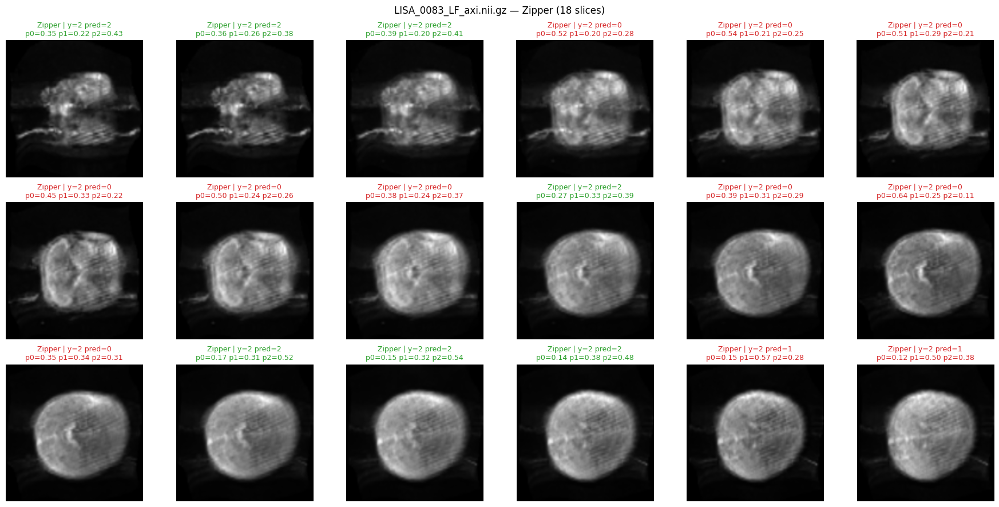

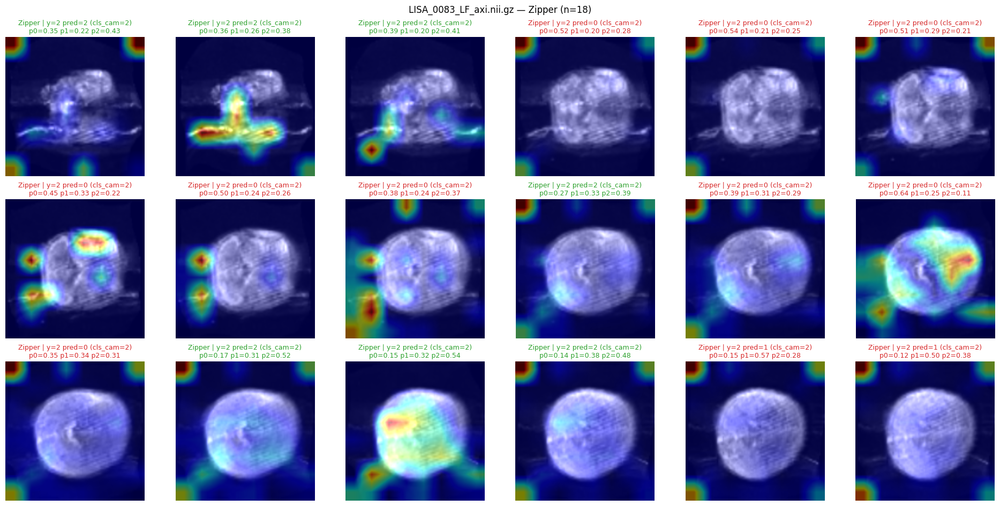

Zipper


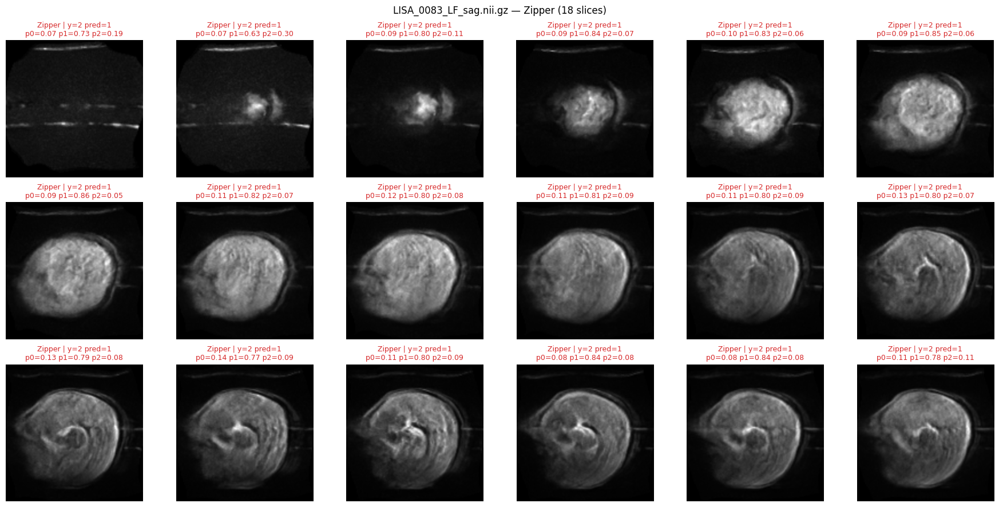

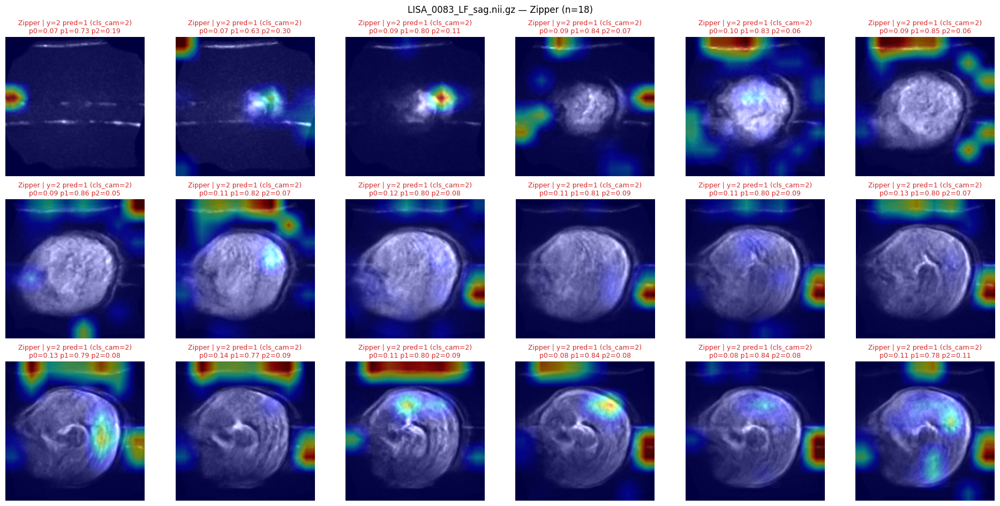

Zipper


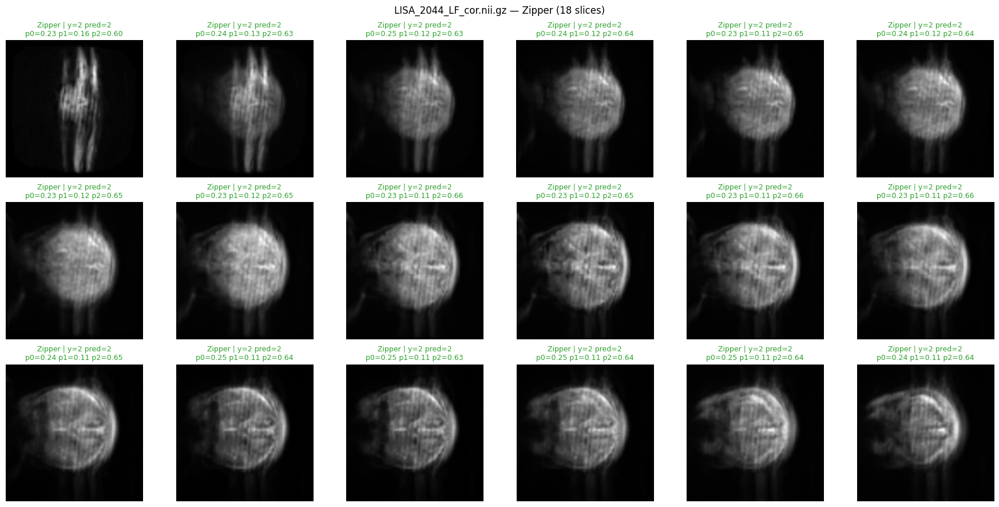

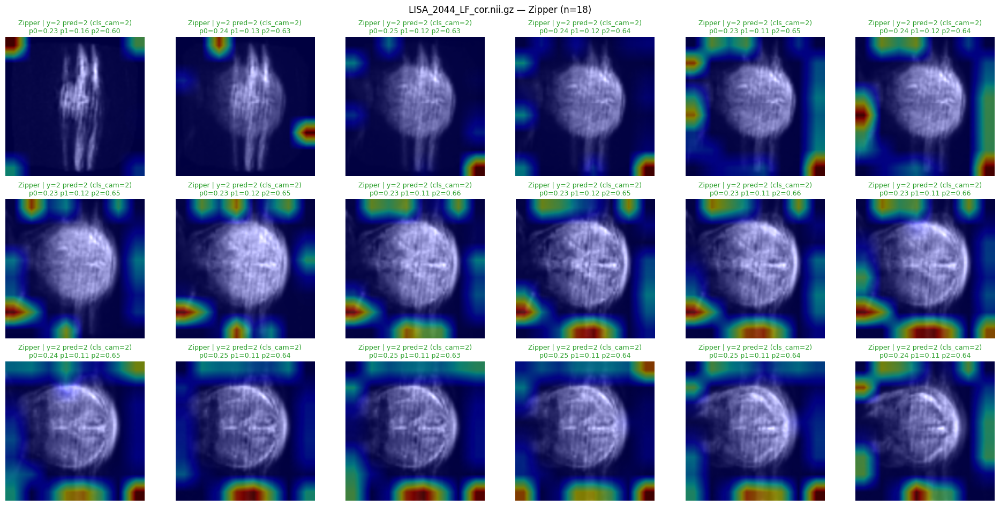

Zipper


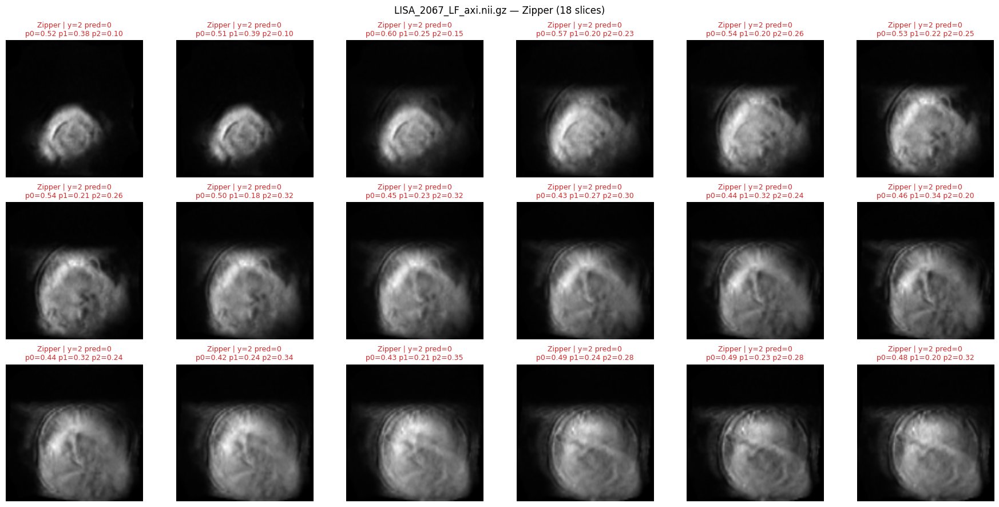

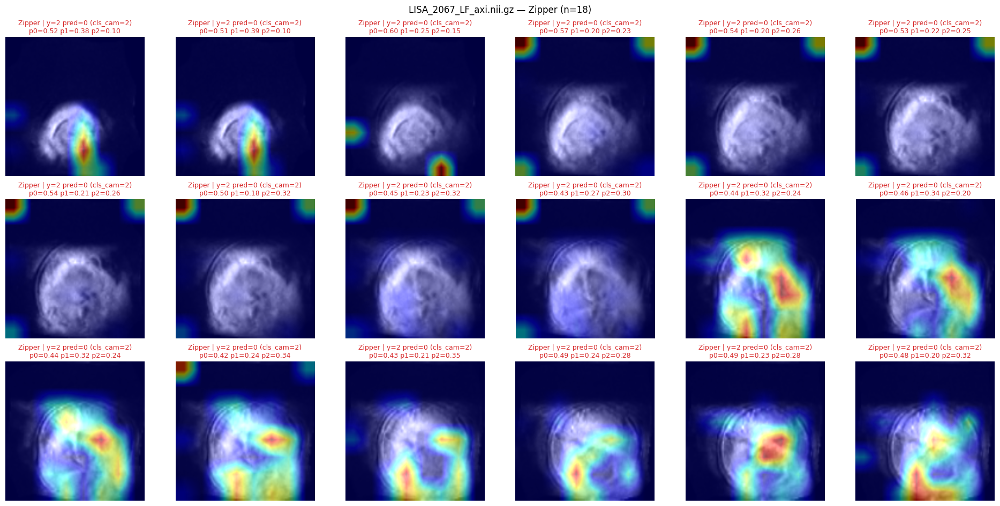

Zipper


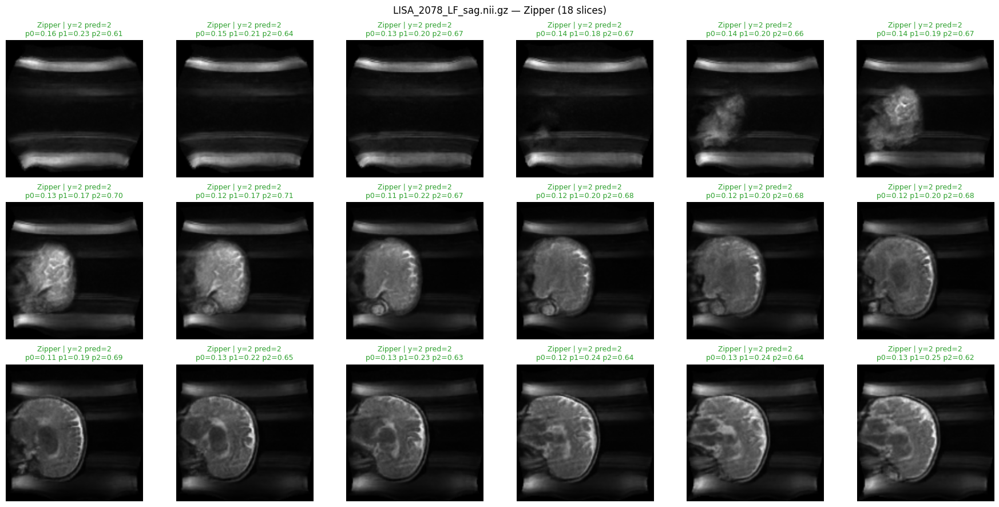

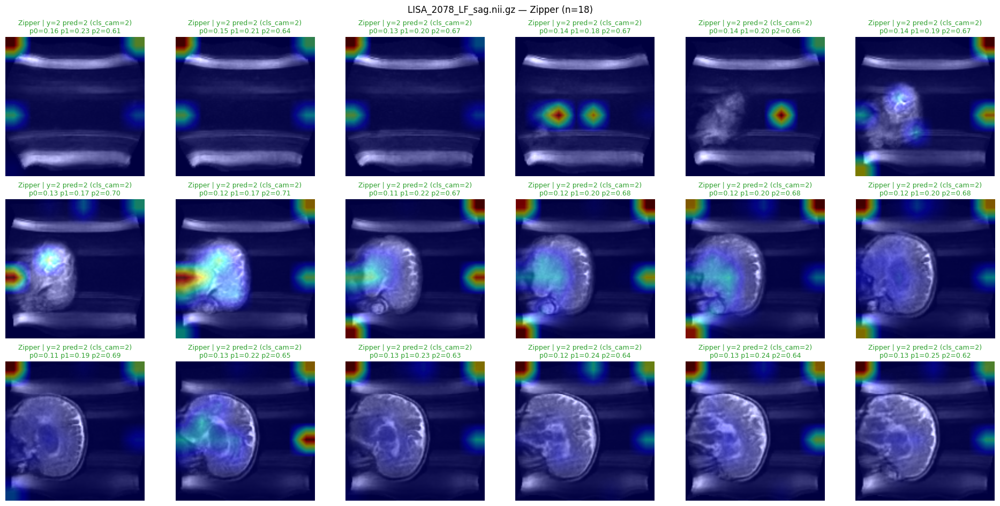

In [10]:
for idy in list_idx:
  print(label_name)
  plot_group_indices(model, dataset_vis, args, range(idy-9,idy+9), label_name=label_name, ncols=6)
  plot_group_indices_with_cam(
    model, dataset_vis, args, range(idy-9,idy+9),
    label_name=label_name,
    ncols=6,
    class_choice=2,   # o 0/1/2 para forzar la clase del CAM
    target_layer=None,     # o pasa tl
    cam_alpha=0.5
  )